Setting the default directory and importing libraries related to image

In [ ]:
from PIL import Image, ImageOps
import os
os.getcwd()

In [53]:
os.chdir('/Users/shankarasubramaniyang/Documents/Spring 2022/Data science methods and tools/Assigments/Moviestrip/')

Reading the captions that are to be used from excel file

In [54]:
import pandas as pd
dialog= pd.read_excel('Native lang/Tamildialog.xlsx',index_col=None, header=None)
dialog.head(5)

,0
0,அமெரிக்காவில் எனது 5 மாதங்கள்
1,தடா சென்னை!! மிஸ் மற்றும் விரைவில் நீங்கள் பார...
2,வணக்கம் பாய்ஸ்!! போர்டிங் செய்வதற்கு முன் ஒரு ...
3,"புதிய நாள், ஒரு புதிய நாட்டில் புதிய தொடக்கம்!!"
4,அடுத்த 2 ஆண்டுகளுக்கு வீடு


All the images are read from the folder using that I have created using PIL and they are resized,added colors ,fonts using ImageFont.truetype,inserted captions into the images and finally the updated images are stored in a seperate folder. Please note that the font I have used can be applied only in Macbook. The code for Windows font is commented out in the below step.

In [55]:
from PIL import Image, ImageDraw, ImageFont, ImageOps
for i in range(1, 62):
    images = Image.open('Native lang/Initial/%d.jpg' %(i))
    images_resize = images.resize((500, 500))
    images_border = ImageOps.expand(images_resize, border=(10,10),fill=(224,224,224))
    
    TINT_COLOR = (0, 0, 0)  
    TRANSPARENCY = .50  
    OPACITY = int(255 * TRANSPARENCY)
    
    images_col = images_border.convert('RGBA')
    overlay = Image.new('RGBA', images_col.size, TINT_COLOR+(0,))
    draw = ImageDraw.Draw(overlay)
    #font = ImageFont.truetype(arial.ttf,35) -- windows 
    font=ImageFont.truetype("TSCu_SaiIndira.ttf",35)
    text = dialog.values[i-1][0]
    w, h = font.getsize(text)
    totallines = len(text.split('\n'))
    #print(totallines, w, h,text)
    
    x, y = 10, images_col.height-10-totallines*h
    draw.rectangle((x, y-10, x + images_col.width - 15, y + totallines*h), fill=TINT_COLOR+(OPACITY,))
    draw.text((x, y-10), text, fill=(255, 255, 255), font=font)
    
    images_dialog = Image.alpha_composite(images_col, overlay)
    images_threecol = images_dialog.convert("RGB")
    images_threecol.save('Native lang/new/%d_new.jpg' %(i))

Displaying a sample image along with captions

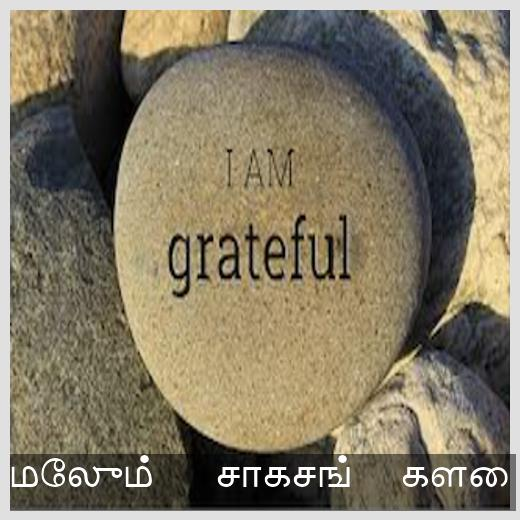

In [56]:
from IPython.display import Image
Image(filename='Native lang/new/%d_new.jpg' %(i), width=200)

The seperate folder(with captions) that was created is read and I am performing a horizontal stacking using numpy function np.hstack in a such a way that there are certain number of images per strip so that it looks good for viewing. The images are aligned and sorted and saved in a new folder horizontal.

In [57]:
from os import listdir
from os.path import isfile, join
import PIL
import numpy as np

mypath = 'Native lang/new/'
file_extract = [f for f in listdir(mypath) if isfile(join(mypath, f))]

if '.DS_Store' in file_extract:
    file_extract.remove('.DS_Store')
file_extract.sort(key=lambda x:int(x.split('_new.jpg')[0]))
print(file_extract)

pageval = 1
while 0 < len(file_extract):
    lines = 0
    print('page '+str(pageval))
    number_col = prev_number_col = 0
    while lines < 5 and 0 < len(file_extract):
        lines += 1
        while number_col == prev_number_col:
            number_col = np.random.randint(2, 5)
        prev_number_col = number_col
        onlyfiles = file_extract[:number_col]  
        print(onlyfiles)
        imgs    = [ PIL.Image.open(mypath+i) for i in onlyfiles ]

# pick the image which is the smallest, and resize the others to match it (can be arbitrary image shape here)
        min_shape = sorted( [(np.sum(i.size), i.size ) for i in imgs])[0][1]
        imgs_comb = np.hstack( (np.asarray( i.resize(min_shape) ) for i in imgs ) )

# save that beautiful picture
        imgs_comb = PIL.Image.fromarray(imgs_comb)
        imgs_comb.save('Native lang/horizontal/'+str(pageval)+str(lines)+'.jpg' )
        file_extract = file_extract[number_col:]
    pageval+=1

['1_new.jpg', '2_new.jpg', '3_new.jpg', '4_new.jpg', '5_new.jpg', '6_new.jpg', '7_new.jpg', '8_new.jpg', '9_new.jpg', '10_new.jpg', '11_new.jpg', '12_new.jpg', '13_new.jpg', '14_new.jpg', '15_new.jpg', '16_new.jpg', '17_new.jpg', '18_new.jpg', '19_new.jpg', '20_new.jpg', '21_new.jpg', '22_new.jpg', '23_new.jpg', '24_new.jpg', '25_new.jpg', '26_new.jpg', '27_new.jpg', '28_new.jpg', '29_new.jpg', '30_new.jpg', '31_new.jpg', '32_new.jpg', '33_new.jpg', '34_new.jpg', '35_new.jpg', '36_new.jpg', '37_new.jpg', '38_new.jpg', '39_new.jpg', '40_new.jpg', '41_new.jpg', '42_new.jpg', '43_new.jpg', '44_new.jpg', '45_new.jpg', '46_new.jpg', '47_new.jpg', '48_new.jpg', '49_new.jpg', '50_new.jpg', '51_new.jpg', '52_new.jpg', '53_new.jpg', '54_new.jpg', '55_new.jpg', '56_new.jpg', '57_new.jpg', '58_new.jpg', '59_new.jpg', '60_new.jpg', '61_new.jpg']
page 1
['1_new.jpg', '2_new.jpg']
['3_new.jpg', '4_new.jpg', '5_new.jpg']
['6_new.jpg', '7_new.jpg', '8_new.jpg', '9_new.jpg']
['10_new.jpg', '11_new.jpg'

<ipython-input-57-d5e452b7e2a9>:30: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  imgs_comb = np.hstack( (np.asarray( i.resize(min_shape) ) for i in imgs ) )


page 2
['17_new.jpg', '18_new.jpg', '19_new.jpg']
['20_new.jpg', '21_new.jpg']
['22_new.jpg', '23_new.jpg', '24_new.jpg']
['25_new.jpg', '26_new.jpg']
['27_new.jpg', '28_new.jpg', '29_new.jpg']
page 3
['30_new.jpg', '31_new.jpg']
['32_new.jpg', '33_new.jpg', '34_new.jpg', '35_new.jpg']
['36_new.jpg', '37_new.jpg']
['38_new.jpg', '39_new.jpg', '40_new.jpg', '41_new.jpg']
['42_new.jpg', '43_new.jpg']
page 4
['44_new.jpg', '45_new.jpg', '46_new.jpg', '47_new.jpg']
['48_new.jpg', '49_new.jpg']
['50_new.jpg', '51_new.jpg', '52_new.jpg', '53_new.jpg']
['54_new.jpg', '55_new.jpg']
['56_new.jpg', '57_new.jpg', '58_new.jpg', '59_new.jpg']
page 5
['60_new.jpg', '61_new.jpg']


The horizontal strip that was created is read and I am performing a vertical stacking using numpy function np.vstack in a such a way that there are certain number of images per strip so that it looks good for viewing. The images are aligned and sorted and saved in a new folder called vertical.

In [59]:
mypath = 'Native lang/horizontal/'
file_extract = [f for f in listdir(mypath) if isfile(join(mypath, f))]

if '.DS_Store' in file_extract:
    file_extract.remove('.DS_Store')
file_extract.sort(key=lambda x:int(x.split('.jpg')[0]))
print(file_extract)

pageval = 1
while 0 < len(file_extract):
    lines = 0
    print('pageval'+str(pageval))
    number_col = prev_number_col = 0
    while lines < 7 and 0 < len(file_extract):
        lines += 1
        while number_col == prev_number_col:
            number_col = np.random.randint(3,7)
        prev_number_col = number_col
        onlyfiles = file_extract[:number_col]  
        print(onlyfiles)
        imgs    = [ PIL.Image.open(mypath+i) for i in onlyfiles ]

# pick the image which is the smallest, and resize the others to match it (can be arbitrary image shape here)
        min_shape = sorted( [(np.sum(i.size), i.size ) for i in imgs])[0][1]
        imgs_comb = np.vstack( (np.asarray( i.resize(min_shape) ) for i in imgs ) )

# save that beautiful picture
        imgs_comb = PIL.Image.fromarray(imgs_comb)
        imgs_comb.save('Native lang/vertical/'+str(pageval)+str(lines)+'.jpg' )
        file_extract = file_extract[number_col:]
    pageval+=1

['11.jpg', '12.jpg', '13.jpg', '14.jpg', '15.jpg', '21.jpg', '22.jpg', '23.jpg', '24.jpg', '25.jpg', '31.jpg', '32.jpg', '33.jpg', '34.jpg', '35.jpg', '41.jpg', '42.jpg', '43.jpg', '44.jpg', '45.jpg', '51.jpg']
pageval1
['11.jpg', '12.jpg', '13.jpg']
['14.jpg', '15.jpg', '21.jpg', '22.jpg']


<ipython-input-59-1d7f5526c42f>:25: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  imgs_comb = np.vstack( (np.asarray( i.resize(min_shape) ) for i in imgs ) )


['23.jpg', '24.jpg', '25.jpg', '31.jpg', '32.jpg', '33.jpg']
['34.jpg', '35.jpg', '41.jpg', '42.jpg']
['43.jpg', '44.jpg', '45.jpg', '51.jpg']


Importing the cv2 package for image processing and using cv2.imread to read the image and cv2.cvtColor to apply colors to it.

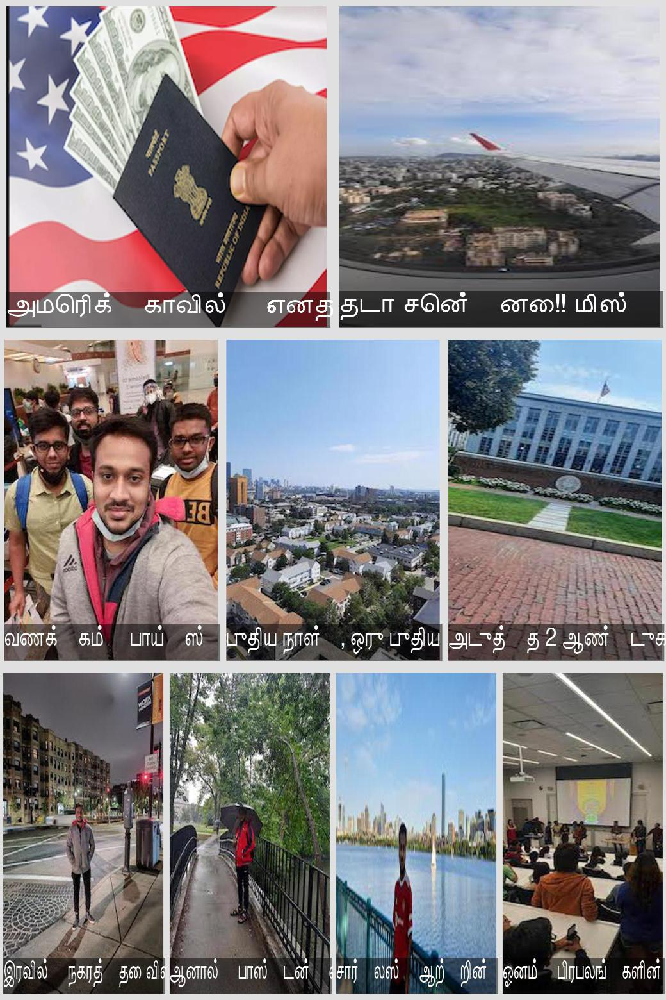

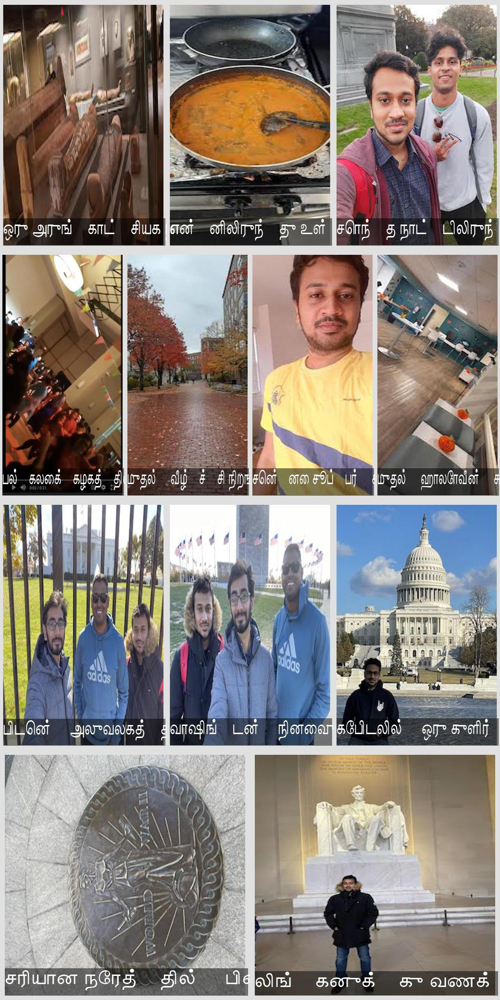

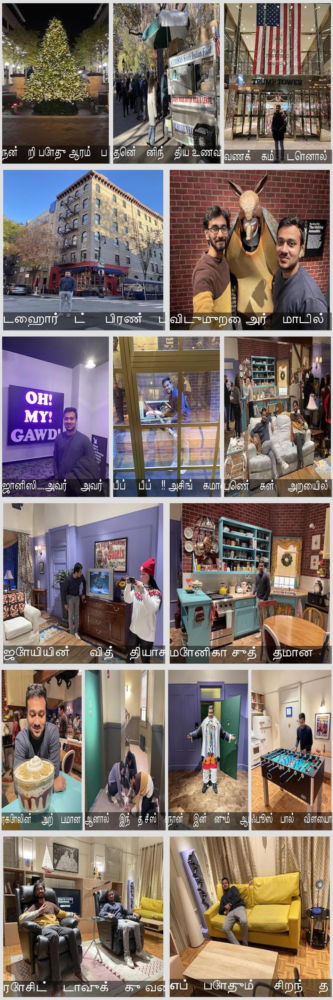

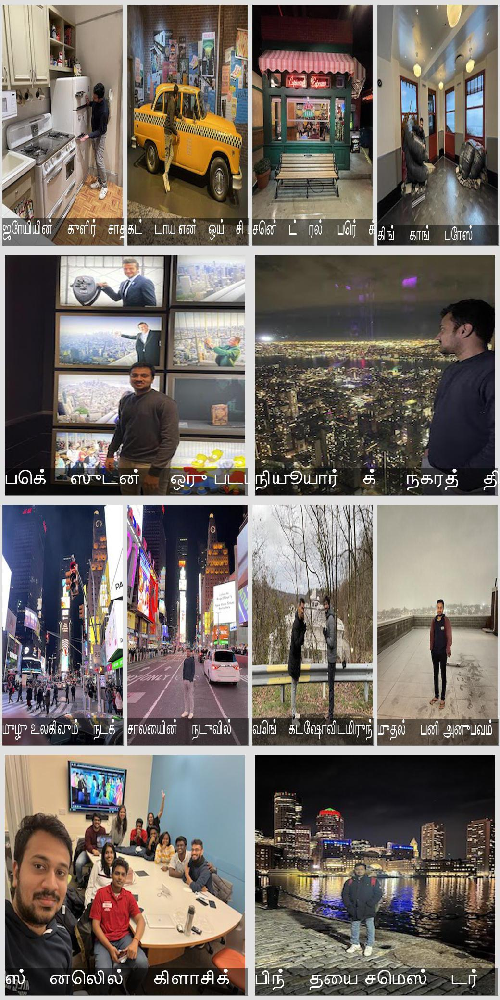

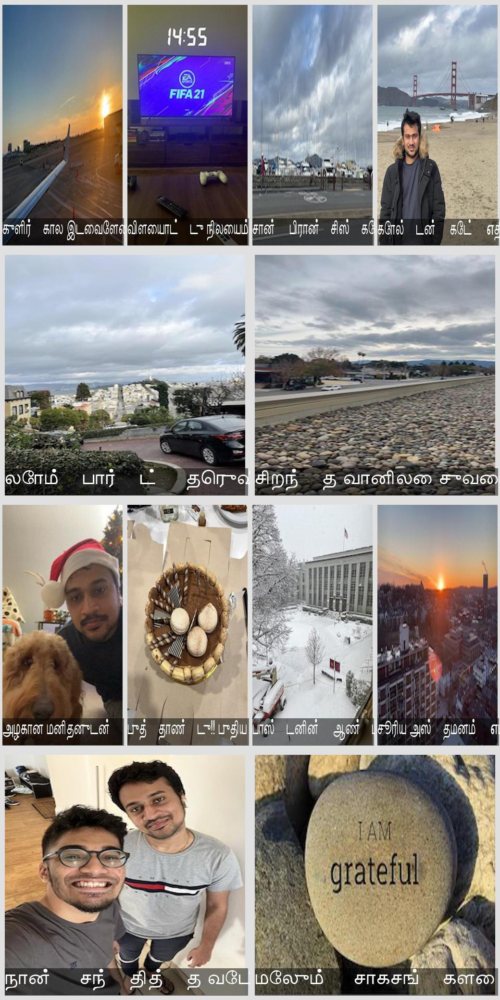

In [60]:
from PIL import Image
import cv2 
from IPython.display import display

# with the OpenCV function imread(), the order of colors is BGR (blue, green, red)
for i in range(11,16):
    img = cv2.imread('Native lang/vertical/%d.jpg' %(i))
#img = [cv2.imread(file) for file in glob.glob("/Users/shankarasubramaniyang/Documents/Spring 2022/Data science methods and tools/Assigments/Moviestrip/Vertical/*.img")]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# In Pillow, the order of colors is assumed to be RGB (red, green, blue).
# As we are using Image.fromarray() of PIL module, we need to convert BGR to RGB.
#img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Converting BGR to RGB

    display(Image.fromarray(img))

Resizing the image using PIL function and used cv2.cvtColor() to convert to greyscale, then cv2.medianBlur() to blur the greyscale in order to remove details that are too fine, then cv2.adaptiveThreshold() to detect the edges of the shapes in the image, then cv2.bitwise_and() to bitblt (superimpose) the original image with its edges and control the blur amount and the width of the borders of the shapes in the image, with the blur and line parameters

In [71]:
from PIL import Image
import cv2 
from IPython.display import display

def imgcompress_mem(path_in, k):
    img = cv2.imread(path_in, cv2.IMREAD_UNCHANGED)

    # set the ratio of resized image
    width = int((img.shape[1])/k)
    height = int((img.shape[0])/k)

    # resize the image by resize() function of openCV library
    return cv2.resize(img, (width, height), interpolation=cv2.INTER_AREA)

def cartoonizebl_mem(path_in, k, blur, line):
    
    imgc = imgcompress_mem(path_in, k)
    #imgc_pil = cv2.cvtColor(imgc, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
    #display(Image.fromarray(imgc_pil))

    line_size = line
    blur_value = blur
    #imgc = cv2.imread(path_out, cv2.IMREAD_UNCHANGED)
    gray = cv2.cvtColor(imgc, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.medianBlur(gray, blur_value)
    bigedges = cv2.adaptiveThreshold(gray_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, line_size, blur_value)
    bigedges_pil = cv2.cvtColor(bigedges, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
    #display(Image.fromarray(bigedges_pil))

    return cv2.bitwise_and(imgc, imgc, mask=bigedges)

Cartoonizing the image and writing it to a folder using cv2.imwrite

In [72]:
for i in range(11,16):   
# with the OpenCV function imread(), the order of colors is BGR (blue, green, red)
    cblimg = cartoonizebl_mem('Native lang/vertical/%d.jpg' %(i), 1, 5, 13)
#cblimg_pil = cv2.cvtColor(cblimg, cv2.COLOR_BGR2RGB)
    #display(Image.fromarray(cblimg_pil)
        
    cv2.imwrite('Native lang/Cartoon/%d.jpg' %(i-10), cblimg)

Finally converting the cartoonized images to PDF using fpdf library and PDF gets created in the specified location.

In [73]:
from PIL import Image
from fpdf import FPDF
from os.path import isfile, join
from os import listdir
import numpy as np
import PIL

path = 'Native lang/Cartoon/'
file_extract = [ f for f in listdir(path) if isfile(join(path, f))]

if '.DS_Store' in file_extract:
    file_extract.remove('.DS_Store')
file_extract.sort(key=lambda x:int(x.split('.jpg')[0]))
print(file_extract)

imgslist = [ path+i for i in file_extract ]

cover = Image.open('Native lang/Cartoon/1.jpg')
width, height = cover.size

pdf = FPDF(unit = "pt", format = [width,height]) 

for img in imgslist:
    pdf.add_page()
    pdf.image(img, 0, 0, width, height)
pdf.output('Native lang/Cartoon/Assignmentcartoon.pdf','F')

['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg']


''